<a href="https://colab.research.google.com/github/CollinHeck/Linear-Regression-Visualized/blob/main/LinearRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Linear Regression Visualized

### Setting up the required libraries.

In [ ]:
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
import numpy as np
from sklearn import datasets
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from matplotlib import rc
import seaborn as sns
from IPython.display import HTML

### Creating a class and some of it's functions

In [ ]:
class LinearRegression:

    #Create object and set some variables
    def __init__(self, learning_rate=0.001, n_iters=1000):
        self.lr = learning_rate
        self.n_iters = n_iters
        self.weights = None
        self.bias = None

    #Uses a gradient descent to minimze error
    def fit(self, X, y, X_test, y_test):
        n_samples, n_features = X.shape
        self.weights = np.zeros(n_features)
        self.bias = 0
        self.weightList = []
        self.biasList = []
        self.mseList = []

        #each loop adjusts bias and weight
        for _ in range(self.n_iters):
            y_predicted = np.dot(X, self.weights) + self.bias
            dw = (1 / n_samples) * np.dot(X.T, (y_predicted - y))
            db = (1 / n_samples) * np.sum(y_predicted - y)
            self.weights -= self.lr * dw
            self.bias -= self.lr * db
            self.weightList.append(self.weights[0])
            self.biasList.append(self.bias)
            predictions = self.predict(X_test)
            mse = mean_squared_error(y_test, predictions)
            self.mseList.append(mse)

    def predict(self, X):
        y_approximated = np.dot(X, self.weights) + self.bias
        return y_approximated

### Creating the data and the regression object.

In [ ]:
def mean_squared_error(y_true, y_pred):
    return np.mean((y_true - y_pred)**2)

X, y = datasets.make_regression(n_samples=100, n_features=1, noise=20, random_state=4)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1234)

regressor = LinearRegression(learning_rate=0.01, n_iters=1000)
regressor.fit(X_train, y_train, X_test, y_test)
predictions = regressor.predict(X_test)

In [ ]:
def update(i):
    #line, = ax.plot(X, i*X, 'r-', linewidth=2)
    #line.set_ydata(i*i+2)
    line.set_data(np.arange(-3,3,0.1),np.arange(-3,3,0.1)*regressor.weightList[i] + regressor.biasList[i])
    ax[1].set_xlabel(i)
    ax[1].plot(regressor.mseList[0:i],'r-', linewidth=2)
    return line, ax

### Running the interactive plot.

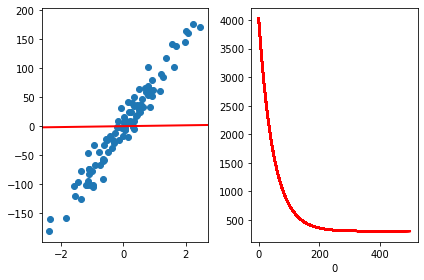

In [ ]:
fig, ax = plt.subplots(1,2)
fig.set_tight_layout(True)

ax[0].scatter(X, y)
ax[1].plot()
line, = ax[0].plot(X, regressor.weights[0]*X + regressor.bias, 'r-', linewidth=2)
anim = FuncAnimation(fig, update, frames=np.arange(0, 500), interval=1.5)

rc('animation', html='jshtml')
anim